## Loading datasets and shuffling

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import joblib
import cv2
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.utils import shuffle

train_df = pd.read_csv("emnist-letters-train.csv")
test_df = pd.read_csv("emnist-letters-test.csv")

train_df.columns = [i for i in range(785)]
test_df.columns = [i for i in range(785)]

print(train_df.shape)
print(train_df.info())
print(test_df.shape)
print(test_df.info())
dataset = pd.concat([train_df, test_df], axis=0)
print(dataset.shape)
print(dataset.info())
dataset = pd.DataFrame(shuffle(dataset))
print(dataset.shape)



(88799, 785)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88799 entries, 0 to 88798
Columns: 785 entries, 0 to 784
dtypes: int64(785)
memory usage: 531.8 MB
None
(14799, 785)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14799 entries, 0 to 14798
Columns: 785 entries, 0 to 784
dtypes: int64(785)
memory usage: 88.6 MB
None
(103598, 785)
<class 'pandas.core.frame.DataFrame'>
Index: 103598 entries, 0 to 14798
Columns: 785 entries, 0 to 784
dtypes: int64(785)
memory usage: 621.2 MB
None
(103598, 785)


## Splitting the dataset into features and labels

In [5]:
labels = dataset.iloc[:, 0]
print(labels.shape)

features = dataset.iloc[:, 1:]
print(features.shape)

(103598,)
(103598, 784)


## Building label map

In [6]:
mp = dict()
for i in range(0, 26):
    mp[i+1] = chr(ord('a') + i)
print(mp)

{1: 'a', 2: 'b', 3: 'c', 4: 'd', 5: 'e', 6: 'f', 7: 'g', 8: 'h', 9: 'i', 10: 'j', 11: 'k', 12: 'l', 13: 'm', 14: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z'}


## Preprocessing images so all have same orientation and shuffling

In [7]:
features = np.array(features)
print(features.shape)
features = features / 255.0

features_image = features.reshape(-1, 28, 28, 1) # adjust on the number of rows, each image is grey 28 * 28
features_image = np.rot90(features_image, axes=(1, 2))
features_image = np.flip(features_image, axis=1)


(103598, 784)


## Drawing images function

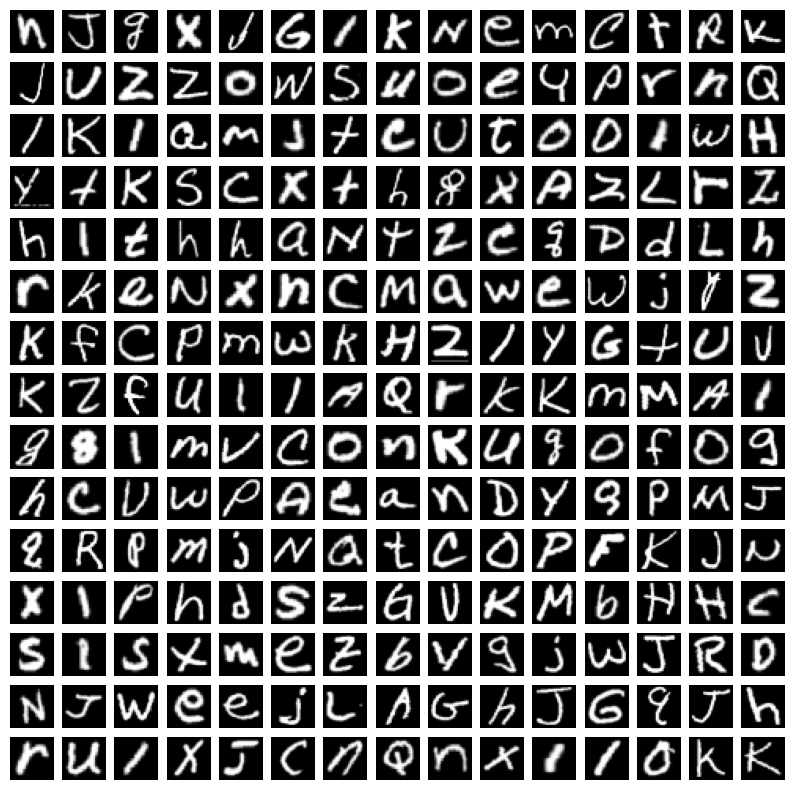

In [41]:
def draw_images(images, row_count, column_count):
    fig, axs = plt.subplots(row_count, column_count, figsize=(10,10))
    for i in range(row_count):
        for j in range(column_count):
            axs[i,j].imshow(images[i * column_count + j], cmap="gray")
            axs[i,j].axis('off')
    plt.show()

indices = np.random.choice(features_image.shape[0], 300) # choose from 0 to 103598 (shape[0]) 300 element
draw_images(features_image[indices].squeeze(), 15, 15)

## train_test_split And fitting model using params from merged

In [42]:
from sklearn.model_selection import train_test_split 

X_train, X_test, y_train, y_test = train_test_split(features, labels, train_size=0.8,
                                                     test_size=0.2, stratify=labels, random_state=42)

classifier = DecisionTreeClassifier(ccp_alpha= 0.0, class_weight= None, criterion='entropy',
            max_depth=20, max_features= None, max_leaf_nodes= None,
            min_impurity_decrease= 0.0, min_samples_leaf= 4, min_samples_split= 10,
              min_weight_fraction_leaf= 0.0, random_state= 42, splitter= 'best')

classifier.fit(X_train, y_train)
joblib.dump(classifier, 'best_DecisonTree_model_merged.joblib')

y_pred = classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
confusionMatrix = confusion_matrix(y_test, y_pred)
print("classifier.score(X_test, y_test): ", classifier.score(X_test, y_test))
print(f'Accuracy of the Best Model: {accuracy}')
print("Classification Report: \n", classification_report(y_test, y_pred))
print("Confusion Matrix: \n", confusionMatrix)


classifier.score(X_test, y_test):  0.7071911196911197
Accuracy of the Best Model: 0.7071911196911197
Classification Report: 
               precision    recall  f1-score   support

           1       0.57      0.60      0.58       839
           2       0.67      0.70      0.68       839
           3       0.79      0.83      0.81       844
           4       0.66      0.68      0.67       840
           5       0.75      0.76      0.76       848
           6       0.66      0.70      0.68       839
           7       0.50      0.49      0.50       837
           8       0.68      0.71      0.69       845
           9       0.60      0.63      0.61       846
          10       0.76      0.78      0.77       840
          11       0.69      0.69      0.69       848
          12       0.63      0.62      0.62       843
          13       0.81      0.85      0.83       840
          14       0.69      0.72      0.70       833
          15       0.83      0.82      0.82       842
         

## Drawing ROC Curve

Train labels: 
11    3390
5     3389
17    3388
16    3384
9     3382
8     3379
18    3375
3     3375
12    3372
15    3366
10    3362
13    3362
4     3358
2     3357
1     3356
6     3355
7     3348
14    3332
19    3034
25    2762
24    2750
20    2749
26    2742
22    2738
23    2738
21    2735
Name: count, dtype: int64
----------------------------------------------------------------------------
0    1         2    3    4    5         6    7    8     9         10   11   12   13   14   15   16        17   18   19        20   21        22        23     24        25      
0.0  0.000000  0.0  0.0  0.0  0.000000  0.0  0.0  0.00  0.000000  0.0  0.0  1.0  0.0  0.0  0.0  0.000000  0.0  0.0  0.000000  0.0  0.000000  0.000000  0.000  0.000000  0.000000    713
               1.0  0.0  0.0  0.000000  0.0  0.0  0.00  0.000000  0.0  0.0  0.0  0.0  0.0  0.0  0.000000  0.0  0.0  0.000000  0.0  0.000000  0.000000  0.000  0.000000  0.000000    712
               0.0  0.0  0.0  0.000000  0.0  0.0  0

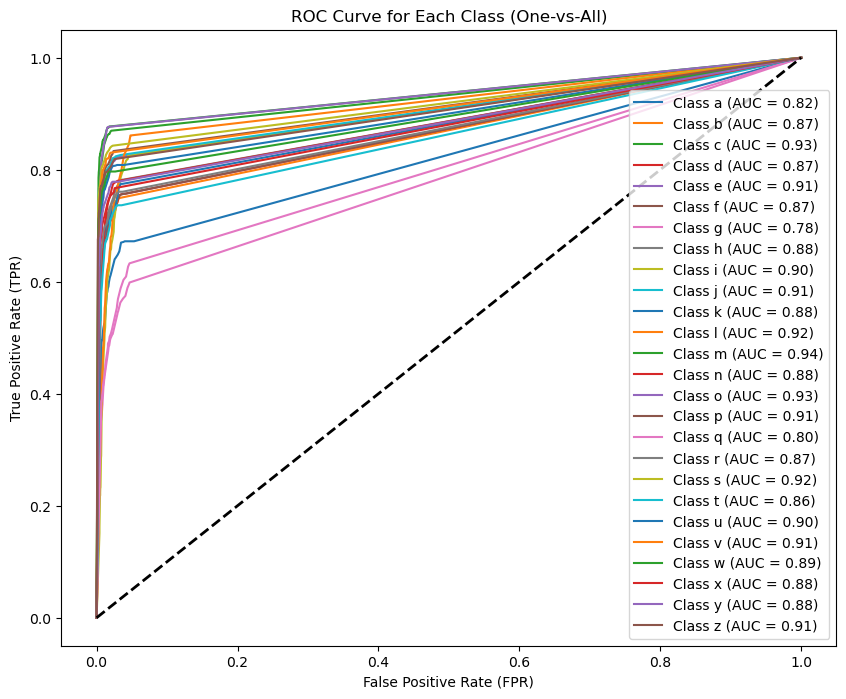

In [44]:
from sklearn.preprocessing import LabelBinarizer
y_score = classifier.predict_proba(X_test)
print("Train labels: ")
print(pd.DataFrame(y_train).value_counts())
print("----------------------------------------------------------------------------")
print(pd.DataFrame(y_score).value_counts())
print("y_score_proba: shape ", y_score.shape)
print("----------------------------------------------------------------------------")
print("Pred labels: ")
print(pd.DataFrame(y_pred).value_counts())
print("----------------------------------------------------------------------------")
print("test_labels: ")
print(pd.DataFrame(y_test).value_counts())
print("----------------------------------------------------------------------------")
print("train_labels: ")
print(pd.DataFrame(y_train).value_counts())
print("----------------------------------------------------------------------------")
print("train_labels: ")
print(np.array(y_train.shape))

label_binarizer = LabelBinarizer()
y_bin = label_binarizer.fit_transform(y_test)

print(y_score.shape, y_bin.shape, y_bin[0], y_test.shape)
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = 26
for i in range(1, n_classes + 1):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i-1], y_score[:, i-1])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(1, n_classes + 1):
    plt.plot(fpr[i], tpr[i], label=f'Class {mp[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Diagonal line for random classifier
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve for Each Class (One-vs-All)')
plt.legend(loc='lower right')
plt.show()

In [8]:
import joblib
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(features, labels, train_size=0.8,
                                                     test_size=0.2, stratify=labels, random_state=42)

classifier = joblib.load('best_DecisonTree_model_merged.joblib')
y_pred = classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
confusionMatrix = confusion_matrix(y_test, y_pred)
print("classifier.score(X_test, y_test): ", classifier.score(X_test, y_test))
print(f'Accuracy of the Best Model: {accuracy}')
print("Classification Report: \n", classification_report(y_test, y_pred))
print("Confusion Matrix: \n", confusionMatrix)


classifier.score(X_test, y_test):  0.8528957528957529
Accuracy of the Best Model: 0.8528957528957529
Classification Report: 
               precision    recall  f1-score   support

           1       0.76      0.85      0.80       839
           2       0.81      0.85      0.83       839
           3       0.88      0.90      0.89       844
           4       0.84      0.85      0.85       840
           5       0.87      0.89      0.88       848
           6       0.83      0.86      0.85       839
           7       0.73      0.78      0.76       837
           8       0.86      0.86      0.86       845
           9       0.75      0.76      0.76       846
          10       0.88      0.89      0.88       840
          11       0.86      0.84      0.85       848
          12       0.77      0.74      0.75       843
          13       0.91      0.93      0.92       840
          14       0.85      0.86      0.85       833
          15       0.92      0.92      0.92       842
         

## Confusion Matrix

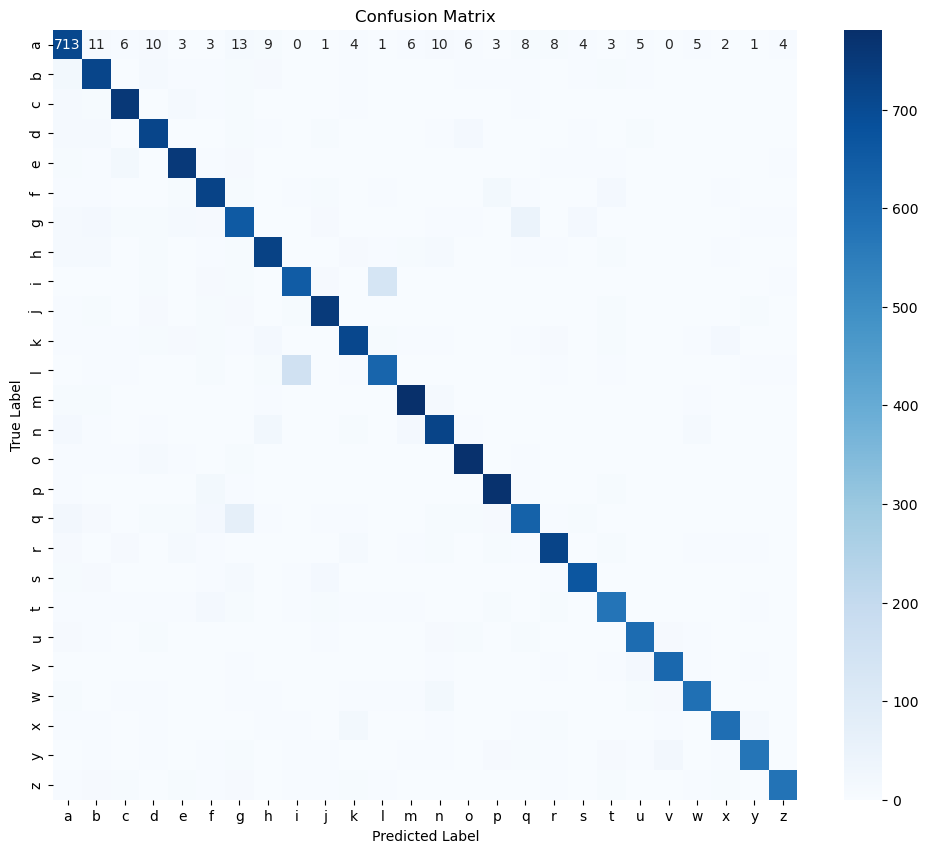

In [11]:
import seaborn as sns

n_classes = 26

ls = []
for i in range(n_classes):
    ls.append(mp[i+1])

plt.figure(figsize=(12, 10))

sns.heatmap(confusionMatrix, annot=True, fmt='d', cmap='Blues', xticklabels=ls, yticklabels=ls)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

## Plotting the Decision Tree

In [48]:
from sklearn.tree import plot_tree

ls = []
for i in range(26):
    ls.append(mp[i+1])

plt.figure(figsize=(64, 256))
plot_tree(classifier, filled=True, class_names=ls)
plt.show()

## Predict the output

(784,)
y
(28, 28, 1)


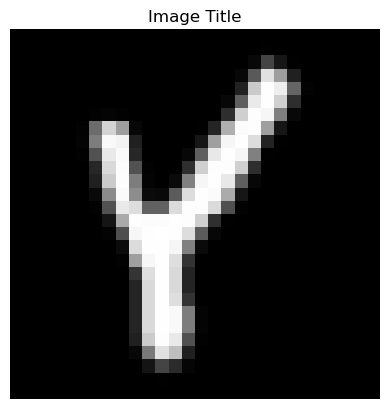

y
True


In [48]:
myRow = dataset.iloc[6, :] # enter row number
label = myRow.iloc[0]
features = myRow[1:]
features = np.array(features)
print(features.shape)
features_image = features.reshape((1,28,28,1))
features_image = np.rot90(features_image, axes=(1, 2))
features_image = np.flip(features_image, axis=1)
features_image = features_image.reshape((28,28,1))

print(mp[label])
print(features_image.shape)
plt.imshow(features_image, cmap='gray')
plt.title('Image Title')
plt.axis('off')  # Optional: Turn off axis labels
plt.show()
classifier = joblib.load('best_DecisonTree_model_merged.joblib')
y_pred = classifier.predict(features.reshape(1, -1))
print(mp[y_pred[0]])
print(y_pred[0] == label)

# draw_images(features_image.squeeze(), 1, 1)